In [1]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import missingno as msno
from matplotlib.pyplot import figure
import seaborn as sns
from scipy.stats import norm, skew 
from scipy import stats
from datetime import date
import matplotlib
from sklearn.linear_model import LinearRegression

In [31]:
df=pd.read_csv("df_final.csv")
df['date']=pd.to_datetime(df['date'])
df1=df.set_index('date',drop=True)

In [80]:
df1.head()

,state,elderly_mode,school_mode,masking_mode,unweighted_ili,flu_av7,flu_per_cap_av7,mask_av7,rr_av7,gp_av7,park_av7,transit_av7,work_av7,resid_av7,school_av7,elderly_av7,mask_policy_av7
date,,,,,,,,,,,,,,,,,
2019-09-29,AL,NaN,NaN,NaN,1.97633,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-09-29,AK,NaN,NaN,NaN,1.04516,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-09-29,AZ,NaN,NaN,NaN,1.06620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-09-29,AR,NaN,NaN,NaN,1.19323,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-09-29,CA,NaN,NaN,NaN,1.36062,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:
df1.columns

Index(['state', 'elderly_mode', 'school_mode', 'masking_mode',
       'unweighted_ili', 'flu_av7', 'flu_per_cap_av7', 'mask_av7', 'rr_av7',
       'gp_av7', 'park_av7', 'transit_av7', 'work_av7', 'resid_av7',
       'school_av7', 'elderly_av7', 'mask_policy_av7'],
      dtype='object')

In [78]:
df1['rr_av7'].dropna()

date
2020-02-16    -2.000000
2020-02-16    -3.285714
2020-02-16    -2.857143
2020-02-16     7.571429
2020-02-16   -11.571429
                ...    
2022-10-09    -9.000000
2022-10-09    -9.428571
2022-10-09     2.285714
2022-10-09    -2.428571
2022-10-09     2.857143
Name: rr_av7, Length: 6899, dtype: float64

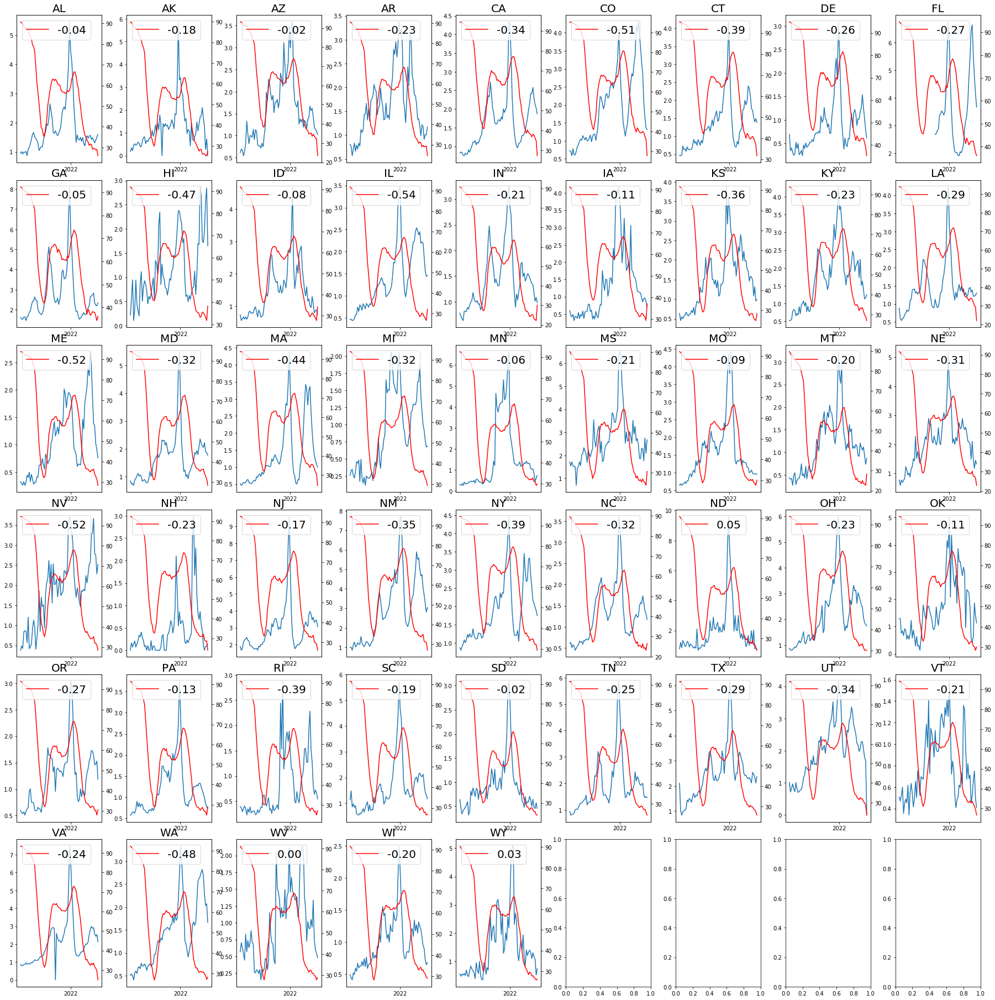

In [66]:
def visualize_corr_all_states(column1,column2,start_date,end_date):
    nrow=6
    ncol=9
    fig, axes = plt.subplots(nrow,ncol,figsize=(25,25))
    fig.tight_layout()
    i=0
    for r in range(nrow):
        for c in range(ncol):
            c1=df1[df1['state']==df1['state'].unique()[i]][column1][start_date:end_date]
            c2=df1[df1['state']==df1['state'].unique()[i]][column2][start_date:end_date]

            axes[r,c].plot(c1,label=df1['state'].unique()[i])
            axes[r,c].set_title(df1['state'].unique()[i],fontsize=20)
            ax2=axes[r,c].twinx()
            corr=round(c1.corr(c2),2)
            ax2.plot(c2,color='red')
            ax2.legend(['{:.2f}'.format(corr)],
                loc = 'upper left',fontsize=20)
            axes[r,c].xaxis.set_major_locator(matplotlib.dates.YearLocator())
            axes[r,c].xaxis.set_major_formatter(matplotlib.dates.DateFormatter("%Y"))
            if i==len(df1['state'].unique())-1:
                break
            i+=1
visualize_corr_all_states('unweighted_ili','mask_av7','2021-02-14','2022-06-26')

In [71]:
def visualize_corr_single_states(column1,column2,start_date,end_date,state):
    nrow=1
    ncol=1
    fig, ax1 = plt.subplots(nrow,ncol,figsize=(15,5))
    fig.tight_layout()
    c1=df1[df1['state']==state][column1][start_date:end_date]
    c2=df1[df1['state']==state][column2][start_date:end_date]

    ax1.plot(c1,label=state)
    ax1.set_title(state,fontsize=20)
    ax2=ax1.twinx()
    corr=round(c1.corr(c2),2)
    ax2.plot(c2,color='red')
    ax2.legend(['{:.2f}'.format(corr)],
        loc = 'upper left',fontsize=20)
    #ax1.xaxis.set_major_locator(matplotlib.dates.YearLocator())
    #ax1.xaxis.set_major_formatter(matplotlib.dates.DateFormatter("%Y"))

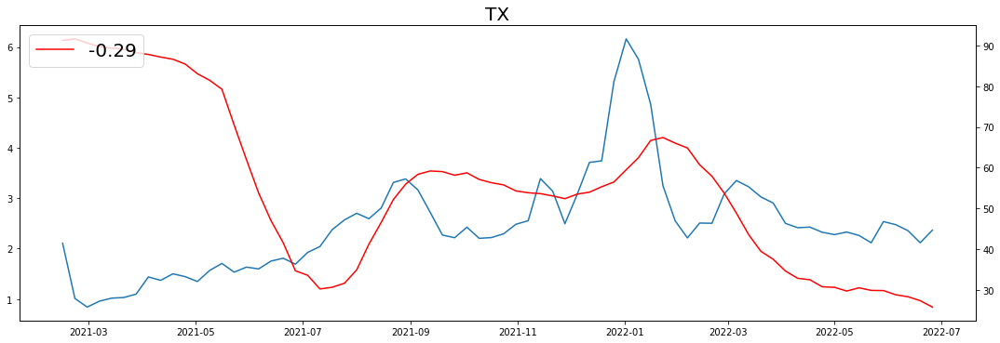

In [72]:
visualize_corr_single_states('unweighted_ili','mask_av7','2021-02-14','2022-06-26','TX')

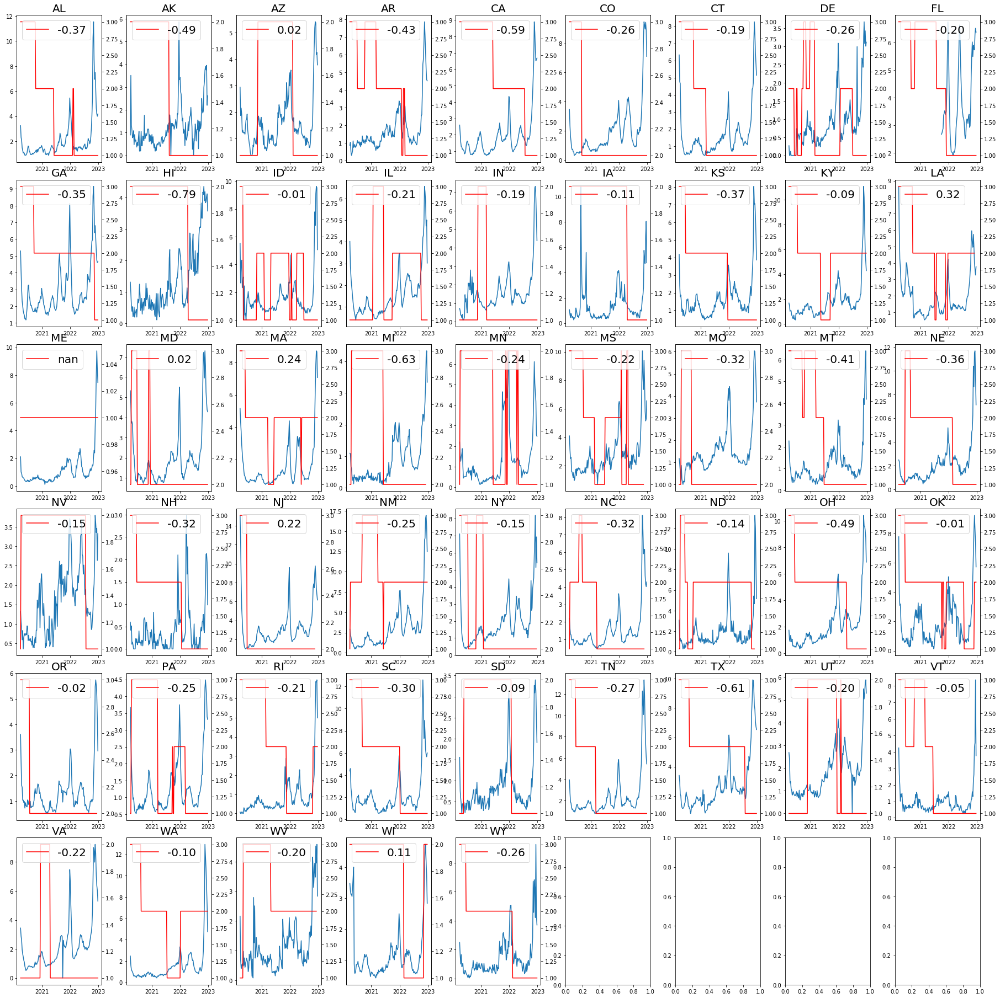

In [74]:
visualize_corr_all_states('unweighted_ili','elderly_mode','2020-03-25','2022-12-25')

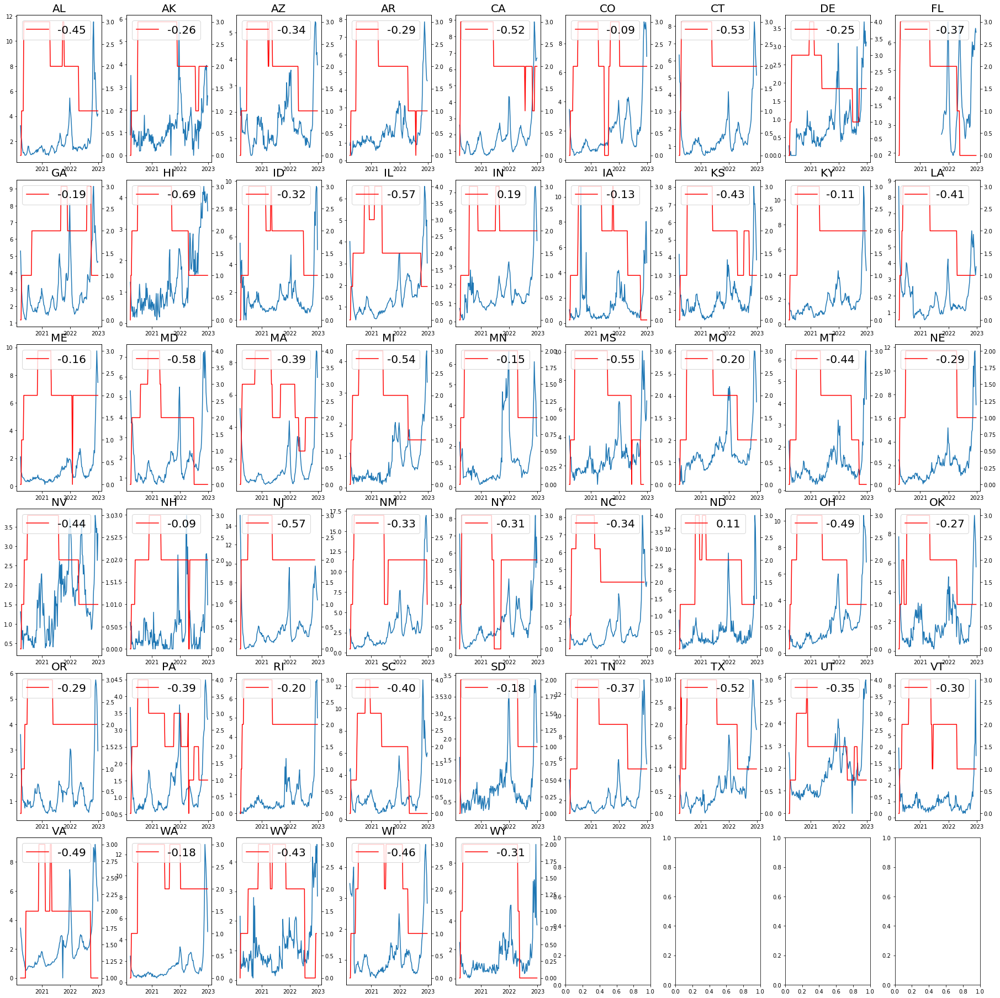

In [75]:
visualize_corr_all_states('unweighted_ili','masking_mode','2020-03-25','2022-12-25')

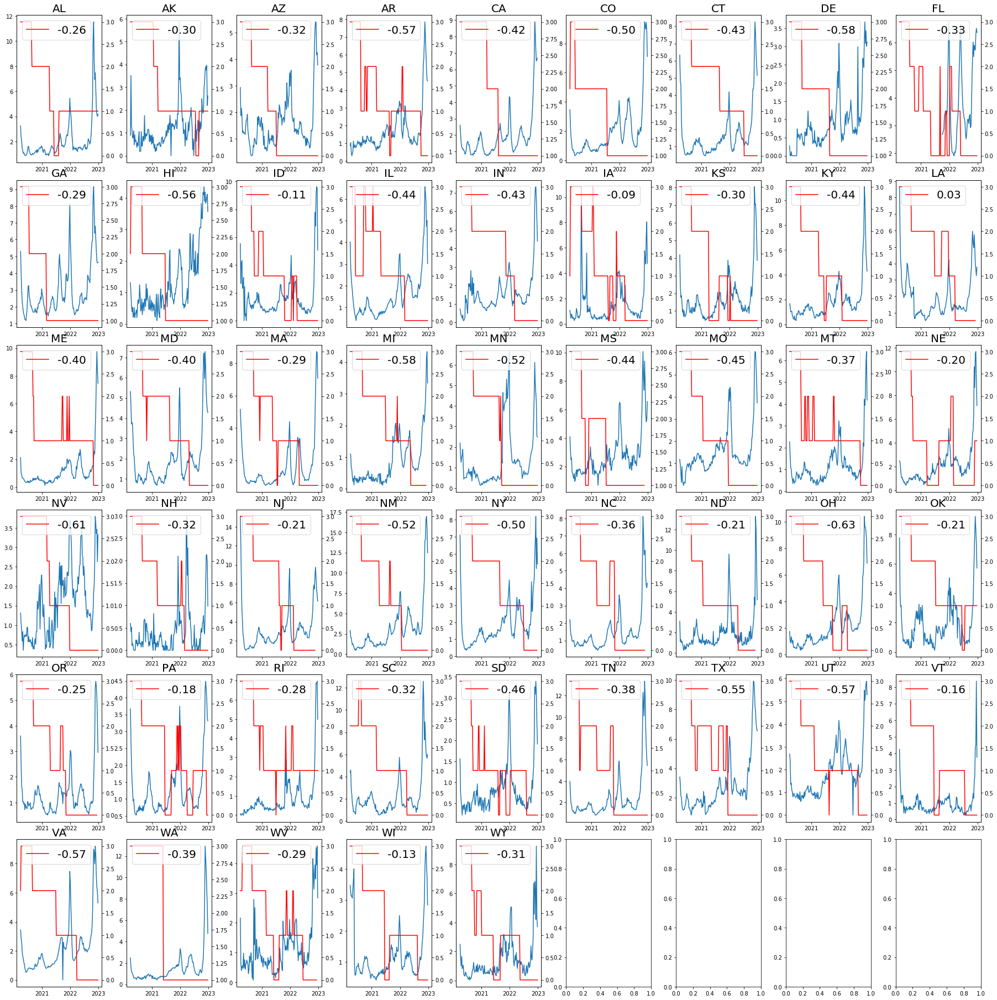

In [76]:
visualize_corr_all_states('unweighted_ili','school_mode','2020-03-25','2022-12-25')

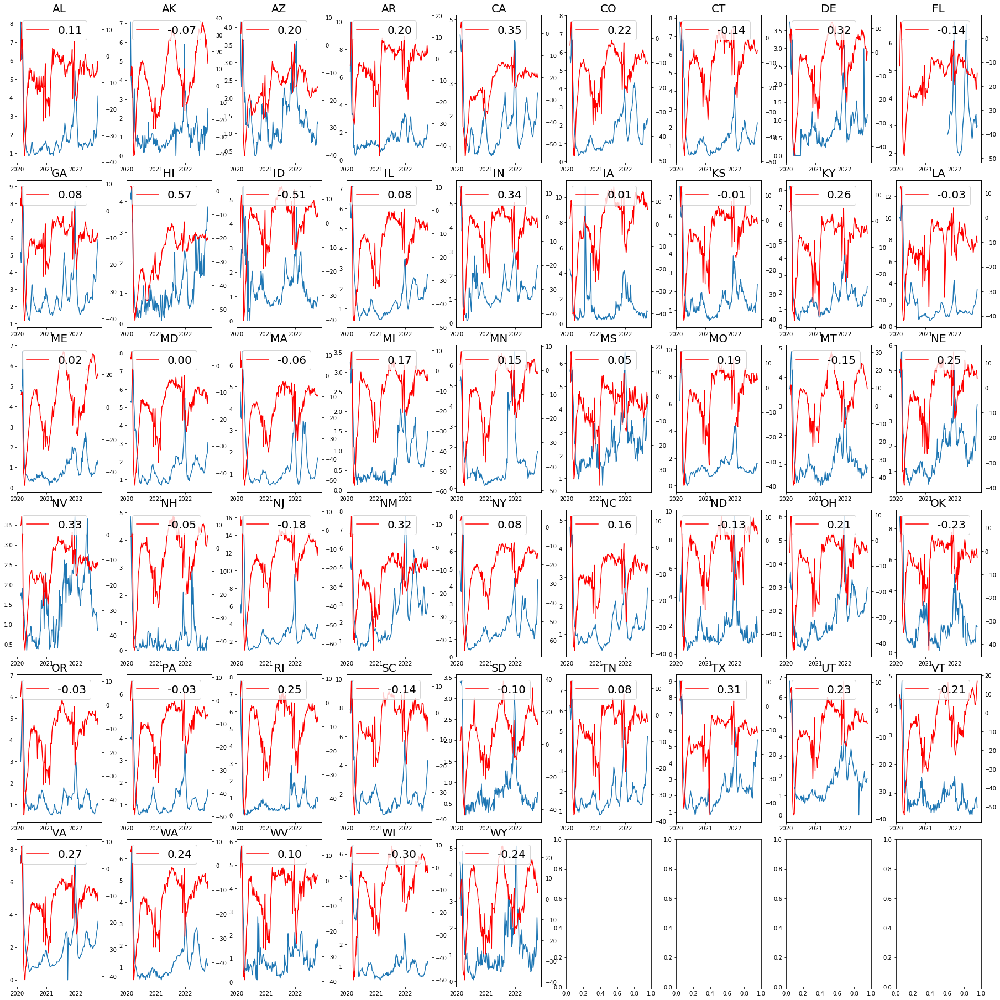

In [79]:
visualize_corr_all_states('unweighted_ili','rr_av7','2020-02-16','2022-10-09')

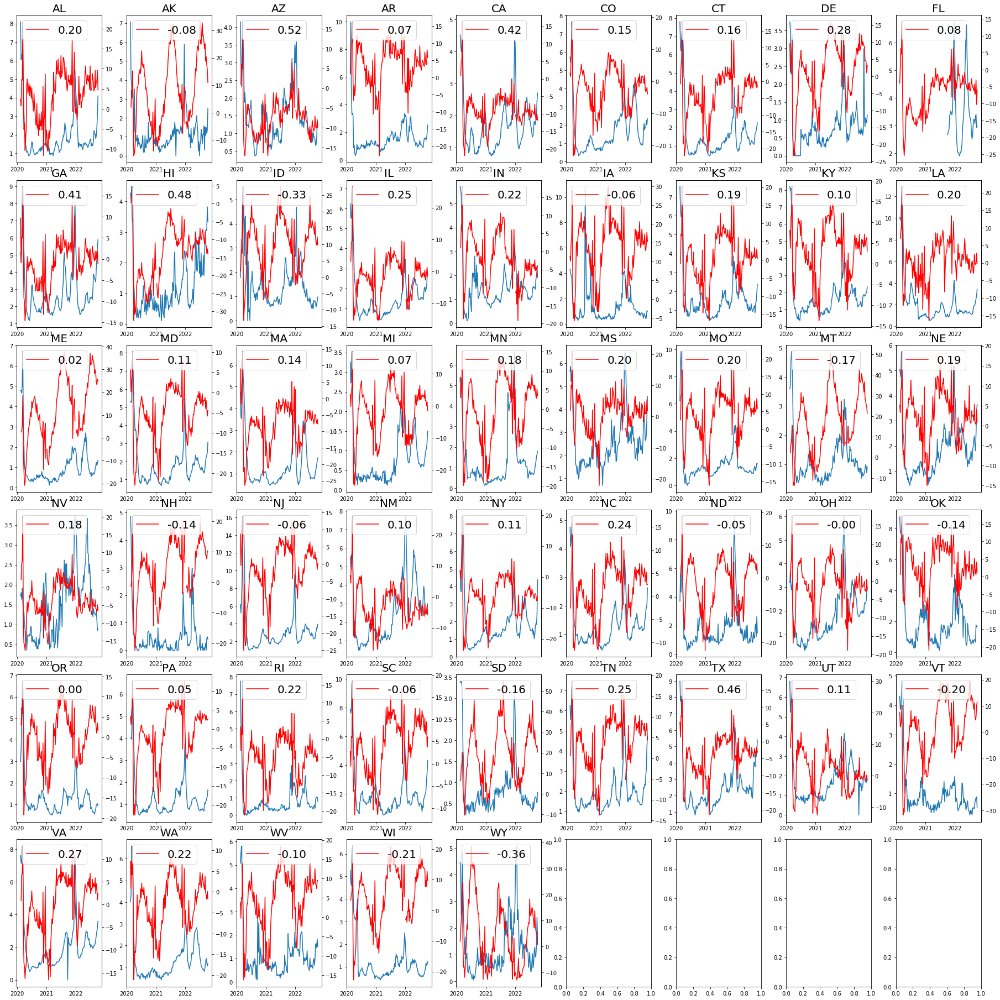

In [83]:
visualize_corr_all_states('unweighted_ili','gp_av7','2020-02-16','2022-10-09')

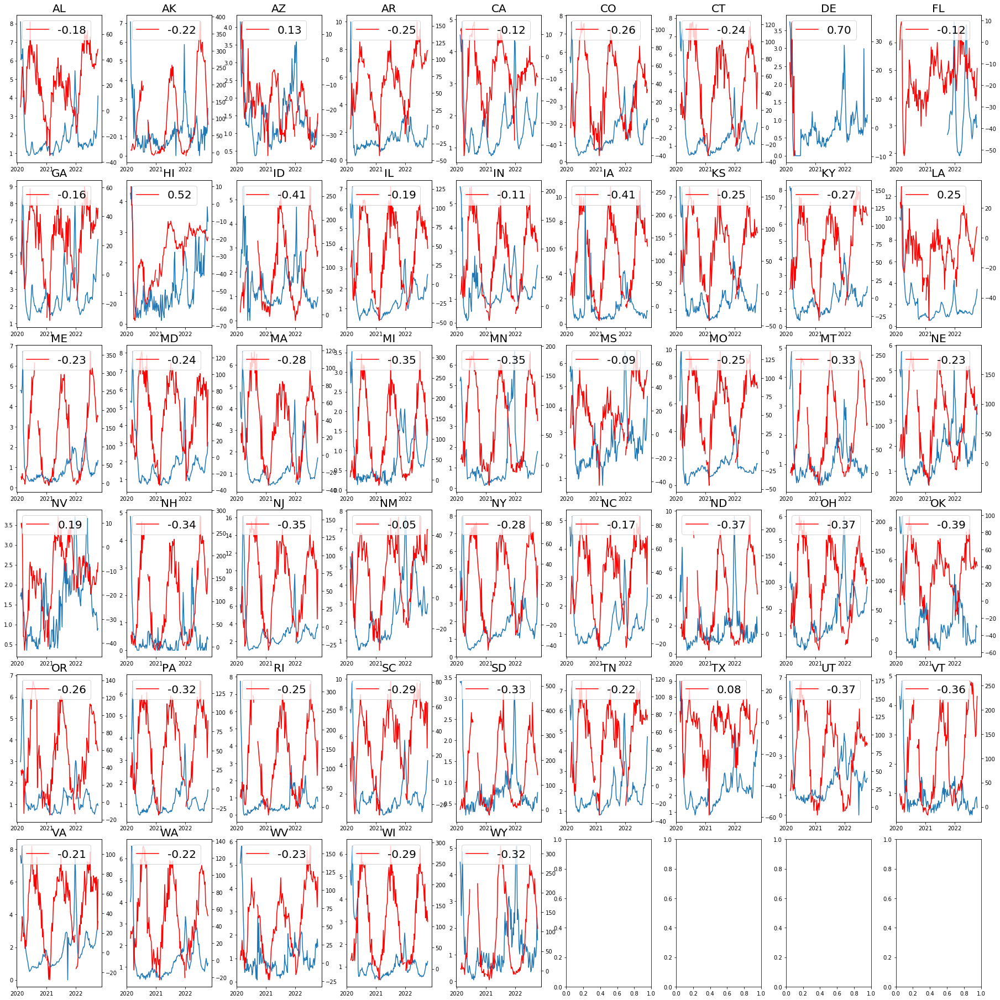

In [84]:
visualize_corr_all_states('unweighted_ili','park_av7','2020-02-16','2022-10-09')


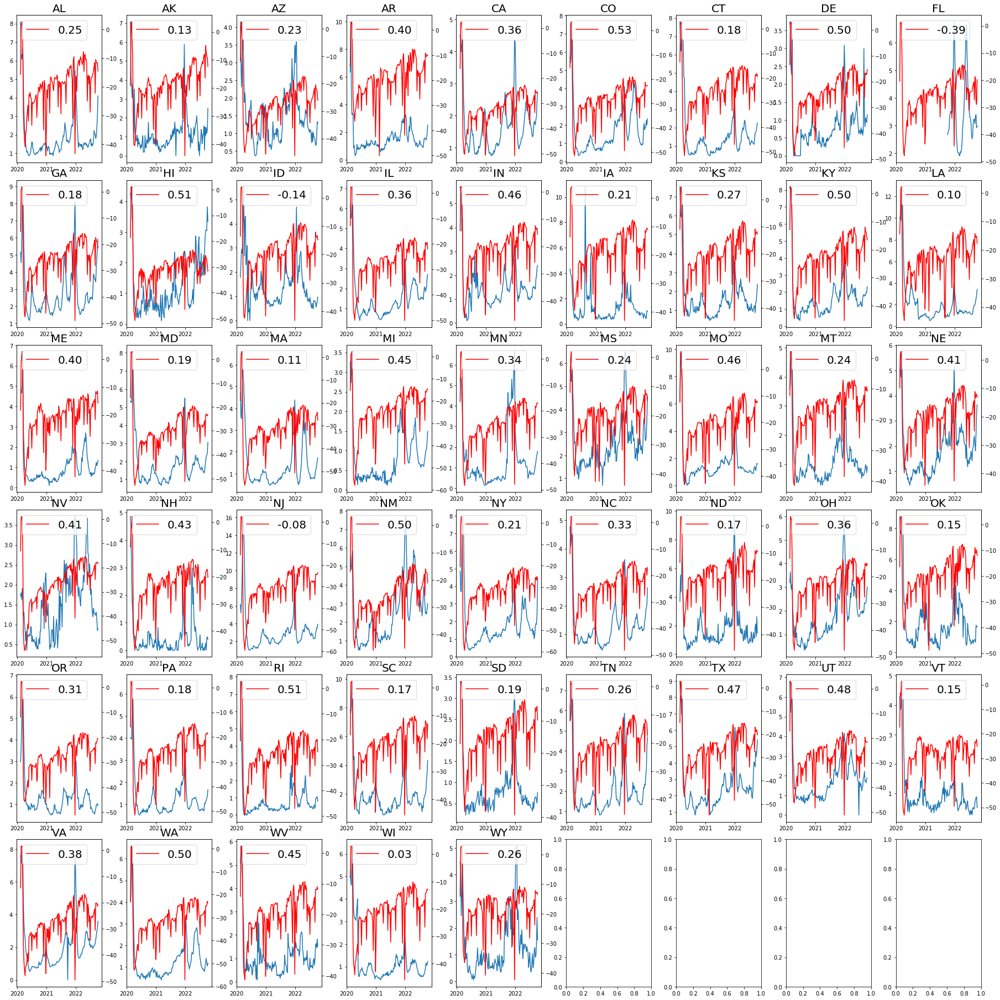

In [85]:
visualize_corr_all_states('unweighted_ili','work_av7','2020-02-16','2022-10-09')

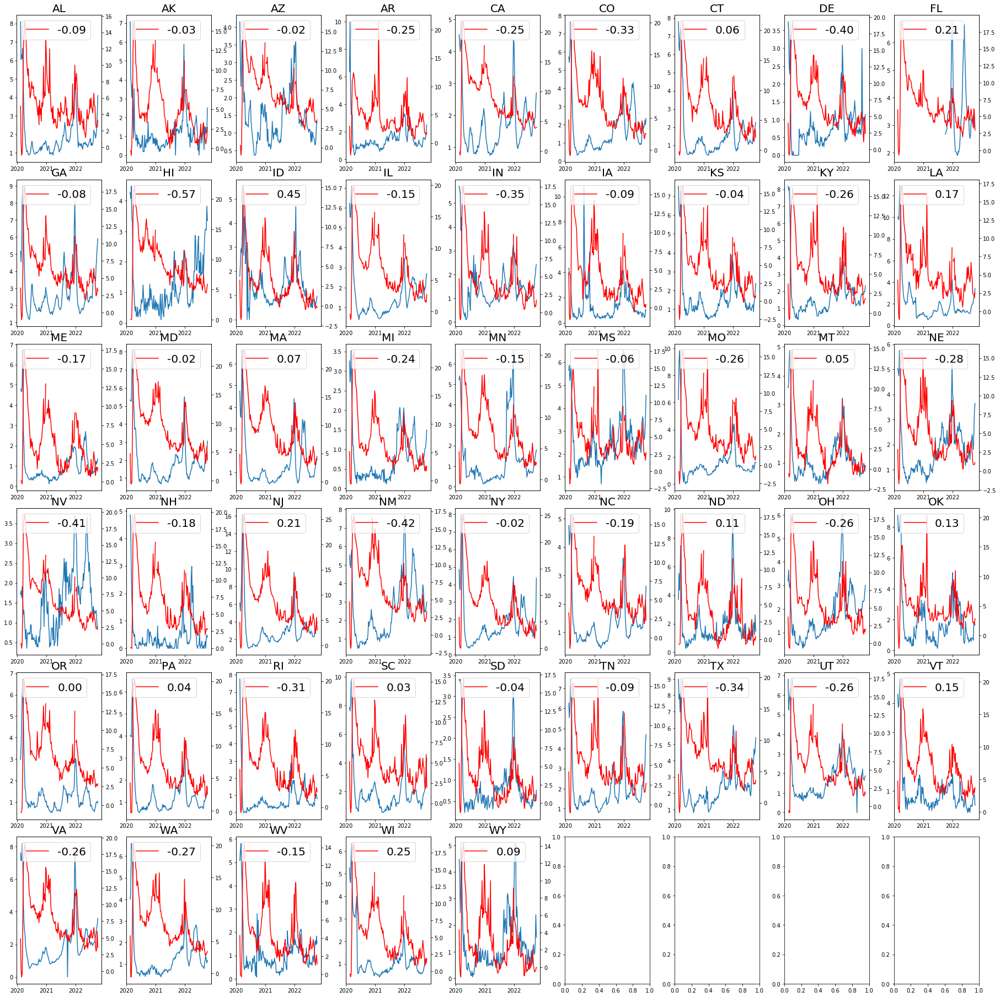

In [86]:
visualize_corr_all_states('unweighted_ili','resid_av7','2020-02-16','2022-10-09')


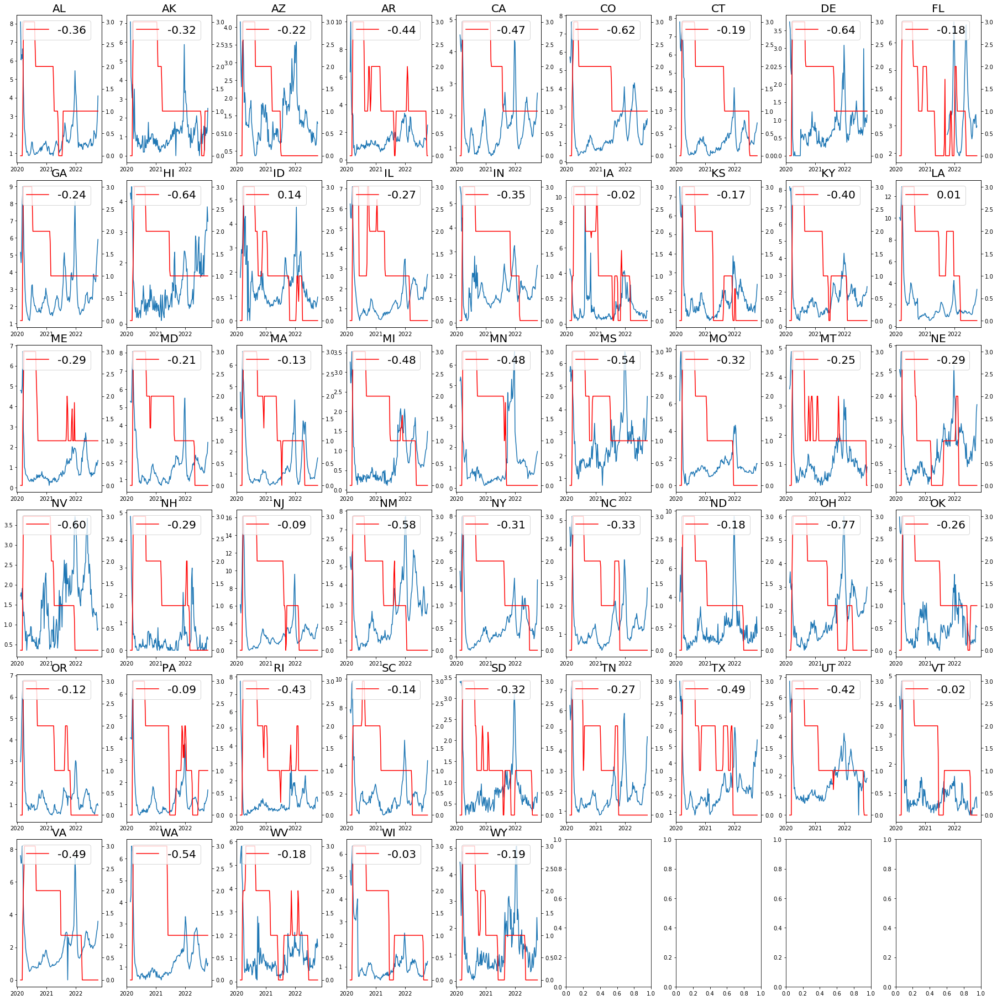

In [87]:
visualize_corr_all_states('unweighted_ili','school_av7','2020-02-16','2022-10-09')